In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
import category_encoders as ce
from sklearn.model_selection import train_test_split

In [2]:
raw_train_df = pd.read_csv("data/Adult_TrainDataset.csv")
raw_test_df = pd.read_csv("data/Adult_TestDataset.csv")
raw_test_df.index=raw_test_df.index+len(raw_train_df)+1
raw_df = pd.concat([raw_train_df,raw_test_df])
raw_df.head()

,Age,Work_Class,Final_Weight,Education,Education-Number,Marital_Status,Occupation,Relationship,Race,Sex,Capital_Gain,Capital_Loss,Hours-Per-Week,Native_Country,Income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [3]:
raw_drop = [
]
raw_cat_col = ['Work_Class','Education','Marital_Status',
    'Occupation','Relationship','Race','Sex','Native_Country']
target_col = 'Income'
raw_scal_col=list(set(raw_df.columns) -set(raw_cat_col) -{target_col})

In [4]:
df = raw_df.drop(raw_drop, axis=1).copy()
df=df[df.index.isin(df[target_col].dropna().index)]
df[target_col]=df[target_col].map({' <=50K.':0, ' >50K.':1,' <=50K':0, ' >50K':1})
temp=(df[target_col]==0).sum()
print((len(df)-temp)/temp, (len(df)-temp)/len(df), len(df))
print(temp/(len(df)-temp), temp/len(df))

0.3145471672722379 0.23928176569346055 48842
3.179173440574998 0.7607182343065395


In [5]:
uniq_val = df.apply(lambda c: c.unique())
for col in raw_cat_col:
    print(col, uniq_val[col].__len__(), sorted(df[col].value_counts()/df.shape[0]*100)[:4])
    print(sorted(df[col].value_counts()/df.shape[0]*100)[-4:])
print()
for col in raw_scal_col:
    print(col, uniq_val[col].__len__(), sorted(df[col].value_counts()/df.shape[0]*100)[:4])

Work_Class 9 [0.020474182056426846, 0.04299578231849638, 2.9319028704803243, 3.47037385856435]
[5.7307235575938735, 6.420703492895459, 7.907129110192048, 69.41976168052086]
Education 16 [0.16993571106834282, 0.5057122967937431, 1.0421358666721263, 1.2161664141517547]
[5.439990172392613, 16.430531100282543, 22.271815240981123, 32.31644895786413]
Marital_Status 7 [0.07575447360877934, 1.2857786331436059, 3.1079808361655954, 3.1325498546333077]
[3.1325498546333077, 13.580524958027926, 32.998239220343144, 45.81917202407764]
Occupation 15 [0.030711273084640268, 0.4954752057655297, 2.012612096146759, 2.960566725359322]
[11.488063551861103, 12.46058719954138, 12.513820072888088, 12.636665165226649]
Relationship 6 [3.0834118176978826, 4.772531837353098, 10.493018303918758, 15.521477416977191]
[10.493018303918758, 15.521477416977191, 25.7626632816019, 40.36689734245117]
Race 5 [0.83125179149093, 0.9622865566520619, 3.1100282543712376, 9.592154293435977]
[0.9622865566520619, 3.1100282543712376, 

In [6]:
%%script false
plt.figure(figsize=(40, 40))
for i, col in enumerate(raw_cat_col):
    if col==target_col: continue
    plt.subplot(5, 4, i + 1)
    sns.scatterplot(x=col, y=target_col, alpha=0.01, data=df[[col, target_col]].dropna().reset_index())
    plt.title(col)
plt.show()
plt.figure(figsize=(40, 40))
for i, col in enumerate(raw_scal_col):
    if col==target_col: continue
    plt.subplot(5, 4, i + 1)
    sns.regplot(x=col, y=target_col, data=df[[col, target_col]].dropna().reset_index())
    plt.title(col)
plt.show()

Couldn't find program: 'false'


In [7]:
for col in raw_cat_col:
    other_val = df[col].value_counts()<0.006*df.shape[0]
    temp3 = [v for is_small,v in list(zip(other_val,other_val.index)) if is_small]
    other_val=[]
    for a in temp3:
        temp=df[df[col]==a]
        if len(temp[temp[target_col]==0])==0: continue
        temp2=len(temp[temp[target_col]==1])/len(temp[temp[target_col]==0])
        if (1.2 >= temp2 >= 0.8) or len(temp)<0.002*len(df): other_val.append(a)
    df[col]=df[col].replace(other_val, 'other')

In [8]:
for col in df.columns:
    if col in raw_cat_col+[target_col]: continue
    temp=df[col].dropna()
    a=temp.quantile(0.99)-temp.quantile(0.01)
    if a<0.001: a=temp.max()-temp.min()
    df[col] = (df[col]-temp.quantile(0.01))/(temp.quantile(0.99)-temp.quantile(0.01))

In [9]:
print(len(df)/len(df.dropna()))
for col in df.columns:
    if df[col].isna().sum()==0: continue
    df[col+"_nan"]=df[col].isna().astype(np.int8)
df=df.fillna(0)

1.0


In [10]:
data_=df.copy()
len(data_)/len(data_.dropna())

1.0

1.0

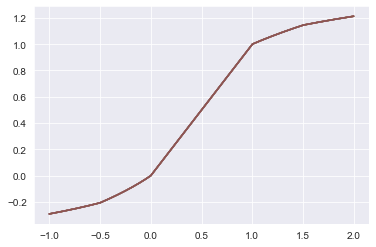

In [11]:
df=data_.copy()
for col in df.columns:
    if col in raw_cat_col+[target_col]: continue
    def curve(x):
        if 0<=x<=1: return x
        if 0<=x<=1.5: return np.cbrt(x)
        if -0.5<=x<=0: return -np.cbrt(-x+0.5)+0.7936
        if x>=1.5: return np.real((x*1.3105)**(1/5))
        if -0.5>=x: return -(-x+0.5)**(1/5)+0.7936
    plt.plot([(x000/1000) for x000 in range(-1000, 2000)], [curve(x000/1000) for x000 in range(-1000, 2000)])
    df[col] = df[col].apply(lambda x: curve(x))
len(df)/len(df.dropna())

In [12]:
temp=[c for c in raw_cat_col if df[c].value_counts().shape[0]==2]
for col in temp:
    unique_values = df[col].unique()
    df[col]=df[col].map({unique_values[0]: 0, unique_values[1]: 1})

temp=[c for c in raw_cat_col if df[c].value_counts().shape[0]>2]
encoder=ce.BinaryEncoder(cols=temp,return_df=True)
df=encoder.fit_transform(df)

In [13]:
data_=df.copy()

In [14]:
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.decomposition import PCA

df=data_.copy()
col=[str(i) for i in range(len(df.drop(target_col, axis=1).columns))]
pca = PCA()
pca.fit(df.drop(target_col, axis=1))
df_tar,df_feat=df[target_col], df.drop(target_col, axis=1)
X_train, X_test=(df_feat[df_feat.index.isin(raw_train_df.index)]),(df_feat[df_feat.index.isin(raw_test_df.index)])

# X_train, X_test=pca.transform(X_train), pca.transform(X_test)
# X_train, X_test=pd.DataFrame(X_train, columns=col),pd.DataFrame(X_test, columns=col)
y_train, y_test=df_tar[df_tar.index.isin(raw_train_df.index)],df_tar[df_tar.index.isin(raw_test_df.index)]

In [117]:
from sklearn.model_selection import GridSearchCV
from deslib.des.des_p import DESP
param_grid = {
    'class_weight': [{0: 1,1:i} for i in np.arange(1.1,1.3,0.05)],
    'max_depth': np.arange(14,16,1),
}
grid_search = GridSearchCV(estimator=RandomForestClassifier(), param_grid=param_grid, scoring='f1_micro')
grid_search.fit(X_train, y_train)
print(grid_search.best_params_)


KeyboardInterrupt



In [16]:
model=RandomForestClassifier(**{'class_weight': {0: 1, 1: 1.2}, 'max_depth': 15})#**grid_search.best_params_)
model.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 1, 1: 1.2}, max_depth=15)

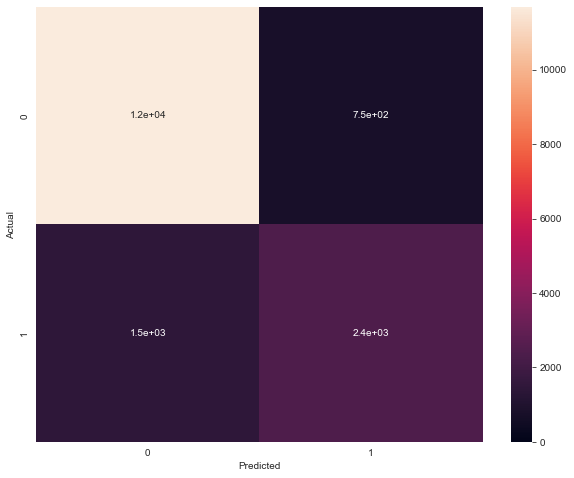

In [17]:
cm=confusion_matrix(y_test, model.predict(X_test))
s = sns.heatmap(cm, annot=True, vmin=0)
s.set(xlabel="Predicted", ylabel="Actual")
plt.gcf().set_size_inches(10, 8)
plt.show(s)

In [18]:
classification_report(y_test, model.predict(X_test), output_dict=True)

{'0': {'precision': 0.8898117808427951,
  'recall': 0.9390430237233615,
  'f1-score': 0.9137647703263166,
  'support': 12435},
 '1': {'precision': 0.759974667511083,
  'recall': 0.62402496099844,
  'f1-score': 0.6853226727584238,
  'support': 3846},
 'accuracy': 0.8646274798845279,
 'macro avg': {'precision': 0.8248932241769391,
  'recall': 0.7815339923609007,
  'f1-score': 0.7995437215423702,
  'support': 16281},
 'weighted avg': {'precision': 0.859140843070314,
  'recall': 0.8646274798845279,
  'f1-score': 0.8598007443299948,
  'support': 16281}}

In [19]:
classification_report(y_train, model.predict(X_train), output_dict=True)

{'0': {'precision': 0.9161859780883435,
  'recall': 0.9573624595469256,
  'f1-score': 0.9363217344859647,
  'support': 24720},
 '1': {'precision': 0.8433878157503715,
  'recall': 0.7238872592781533,
  'f1-score': 0.7790817376981677,
  'support': 7841},
 'accuracy': 0.9011393998955806,
 'macro avg': {'precision': 0.8797868969193574,
  'recall': 0.8406248594125394,
  'f1-score': 0.8577017360920662,
  'support': 32561},
 'weighted avg': {'precision': 0.8986554848328525,
  'recall': 0.9011393998955806,
  'f1-score': 0.898456840446681,
  'support': 32561}}

In [18]:
a=list(zip(X_train.columns,model.feature_importances_))
a.sort(key=lambda x: -x[1])
list(a)

[('Capital_Gain', 0.14431129736089238),
 ('Relationship_1', 0.11478924006143833),
 ('Education-Number', 0.11298130864678008),
 ('Age', 0.08994812465488716),
 ('Marital_Status_2', 0.08889385065074083),
 ('Hours-Per-Week', 0.06282866621757992),
 ('Marital_Status_1', 0.052596692195584265),
 ('Final_Weight', 0.04601543267951089),
 ('Relationship_0', 0.04303478504122979),
 ('Capital_Loss', 0.039405007929598744),
 ('Occupation_3', 0.031356748143850435),
 ('Occupation_0', 0.02325951016293469),
 ('Relationship_2', 0.021674992161289177),
 ('Sex', 0.013677847178311015),
 ('Education_3', 0.013051413414939898),
 ('Education_1', 0.010153341254787267),
 ('Occupation_2', 0.00976871472540602),
 ('Occupation_1', 0.00944391405288605),
 ('Work_Class_3', 0.009311877227629937),
 ('Education_4', 0.00921547934641561),
 ('Work_Class_1', 0.00844228916918374),
 ('Education_2', 0.007658980334886465),
 ('Work_Class_2', 0.0071826249953441754),
 ('Marital_Status_0', 0.004815148146536812),
 ('Race_1', 0.004674557219

In [19]:
selected_feat=list(list(zip(*a[:15]))[0])
selected_feat

['Capital_Gain',
 'Relationship_1',
 'Education-Number',
 'Age',
 'Marital_Status_2',
 'Hours-Per-Week',
 'Marital_Status_1',
 'Final_Weight',
 'Relationship_0',
 'Capital_Loss',
 'Occupation_3',
 'Occupation_0',
 'Relationship_2',
 'Sex',
 'Education_3']

In [27]:
def conf_matr(model, X_test, y_test):
    pred=model.predict(X_test)
    print(classification_report(y_test, pred, output_dict=True))
    cm=confusion_matrix(y_test, pred)
    s = sns.heatmap(cm, annot=True, vmin=0)
    s.set(xlabel="Predicted", ylabel="Actual")
    plt.gcf().set_size_inches(8, 6)
    plt.show(s)

In [126]:
def smaller_data(data_, frac=0.3):
    sX_train, sy_train = None,None
    for i in [0,1]:
        temp_y_train=y_train[y_train==i].sample(frac=frac)
        temp_X_train=X_train[X_train.index.isin(temp_y_train.index)]
        if sX_train is None: sX_train, sy_train = temp_X_train.copy(), temp_y_train.copy()
        else:
            sX_train, sy_train = pd.concat([sX_train, temp_X_train]), pd.concat([sy_train, temp_y_train])
    print(len(sX_train)/len(X_train))
    temp=(sy_train==0).sum()
    print(temp/(len(sy_train)-temp), temp/len(sy_train), (len(sy_train)-temp)/len(sy_train), len(sy_train))
    return sX_train, sy_train

In [33]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
sX_train, sy_train=smaller_data(data_)
param_grid = {
    'class_weight': [{0: 1,1:i} for i in np.arange(0.85,0.95,0.05)],
    'kernel': ['poly'],
    'C': [1.35,1.45,1.4],
    'degree': [3]
}
grid_search = GridSearchCV(estimator=svm.SVC(), param_grid=param_grid, scoring='f1_micro')
grid_search.fit(sX_train[selected_feat], sy_train)
print(grid_search.best_params_)

0.29999078652375544
3.1530612244897958 0.7592137592137592 0.24078624078624078 9768
{'C': 1.35, 'class_weight': {0: 1, 1: 0.9}, 'degree': 3, 'kernel': 'poly'}


{'0': {'precision': 0.8568958063121487, 'recall': 0.9563329312424608, 'f1-score': 0.9038878121080834, 'support': 12435}, '1': {'precision': 0.7740324594257179, 'recall': 0.4836193447737909, 'f1-score': 0.5952952472395583, 'support': 3846}, 'accuracy': 0.8446655610834716, 'macro avg': {'precision': 0.8154641328689333, 'recall': 0.7199761380081259, 'f1-score': 0.7495915296738209, 'support': 16281}, 'weighted avg': {'precision': 0.8373213064580113, 'recall': 0.8446655610834716, 'f1-score': 0.8309901396994877, 'support': 16281}}


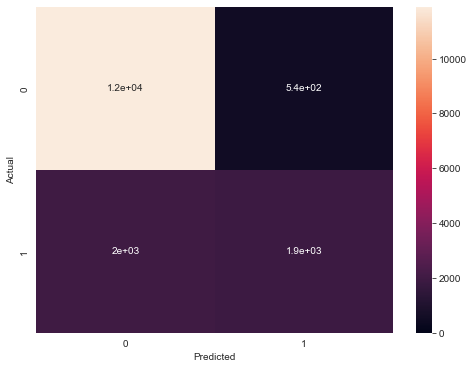

In [34]:
model = svm.SVC(**grid_search.best_params_)
model.fit(X_train[selected_feat], y_train)
conf_matr(model, X_test[selected_feat], y_test)

In [129]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
sX_train, sy_train=smaller_data(data_)
param_grid = {
    'n_neighbors': [27,25,22,30]
}
grid_search = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=param_grid, scoring='f1_micro')
grid_search.fit(X_train[selected_feat], y_train)
print(grid_search.best_params_)

0.29999078652375544
3.1530612244897958 0.7592137592137592 0.24078624078624078 9768
{'n_neighbors': 25}


{'0': {'precision': 0.8752179516336897, 'recall': 0.9284278246883796, 'f1-score': 0.901038008272848, 'support': 12435}, '1': {'precision': 0.7119741100323624, 'recall': 0.5720228809152366, 'f1-score': 0.6343713956170703, 'support': 3846}, 'accuracy': 0.8442356120631411, 'macro avg': {'precision': 0.7935960308330261, 'recall': 0.7502253528018081, 'f1-score': 0.7677047019449592, 'support': 16281}, 'weighted avg': {'precision': 0.8366554668478224, 'recall': 0.8442356120631411, 'f1-score': 0.8380443474243668, 'support': 16281}}


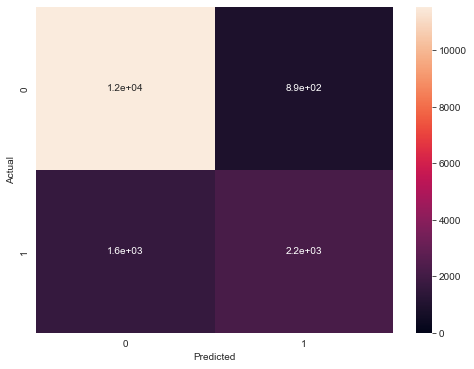

In [130]:
model = KNeighborsClassifier(**grid_search.best_params_)
model.fit(X_train[selected_feat], y_train)
conf_matr(model, X_test[selected_feat], y_test)

In [34]:
aug=X_train[y_train==1][selected_feat]
aug=[X_train[selected_feat], aug.sample(frac=0.5),aug.sample(frac=0.5),aug.sample(frac=0.2),
     aug.sample(frac=0.5),aug.sample(frac=0.5)]
temp=[y_train[y_train.index.isin(i.index)] for i in aug]
aug=pd.concat(aug)
temp=pd.concat(temp)
print(sum(temp==1)/len(aug))
aug=[temp,aug]

0.5037041498524363


In [32]:
from sklearn.naive_bayes import *
model = ComplementNB()
model.fit(aug[1]+1.5, aug[0])
conf_matr(model, X_test[selected_feat]+1.5, y_test)

In [20]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
X_2d = tsne.fit_transform(X_train[selected_feat])

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [25]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(25)
clf.fit(X_train[selected_feat], y_train)
mesh_color = clf.predict(X_train[selected_feat])

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1163: UserWarning: cmap parameter ignored when using hue mapping.
  warnings.warn(msg, UserWarning)
E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'style', 'size'
  cset = contour_func(


<AxesSubplot:>

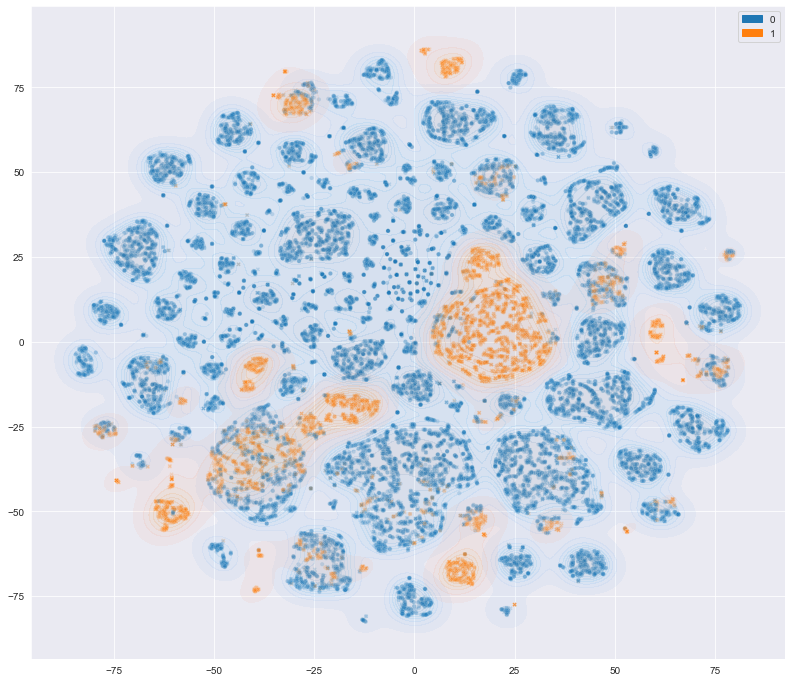

In [26]:
plt.gcf().set_size_inches(13.5, 12)
sns.scatterplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=y_train,alpha=0.2,size=2)
sns.kdeplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=y_train,alpha=0.1,size=2,cmap="Reds", shade=True, bw_adjust=.5)

In [29]:
from sklearn import svm
clf = svm.SVC(**{'C': 1.35, 'class_weight': {0: 1, 1: 0.9}, 'degree': 3, 'kernel': 'poly'})
clf.fit(X_train[selected_feat], y_train)
mesh_color = clf.predict(X_train[selected_feat])

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1163: UserWarning: cmap parameter ignored when using hue mapping.
  warnings.warn(msg, UserWarning)
E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'style', 'size'
  cset = contour_func(


<AxesSubplot:>

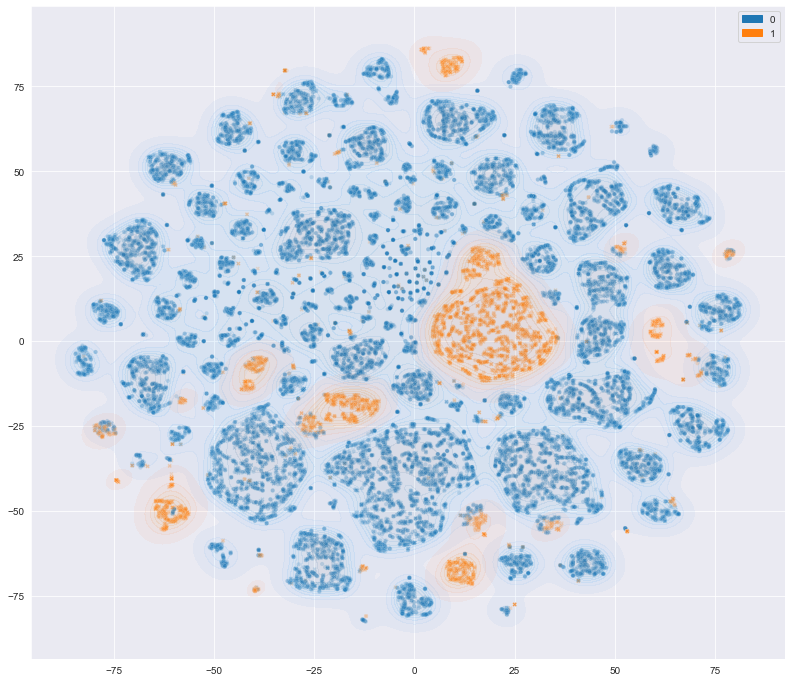

In [30]:
plt.gcf().set_size_inches(13.5, 12)
sns.scatterplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=y_train,alpha=0.2,size=2)
sns.kdeplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=y_train,alpha=0.1,size=2,cmap="Reds", shade=True, bw_adjust=.5)

In [ ]:
import plotly.express as px
plt.gcf().set_size_inches(501, 12)
temp=df.index.isin(clf.support_)
px.scatter(x=X_2d[:,0], y=X_2d[:,1], color=temp.astype(int), width=1200, height=800, opacity=0.3)

<Figure size 36072x864 with 0 Axes>

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1163: UserWarning: cmap parameter ignored when using hue mapping.
  warnings.warn(msg, UserWarning)
E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'style', 'size'
  cset = contour_func(


<AxesSubplot:>

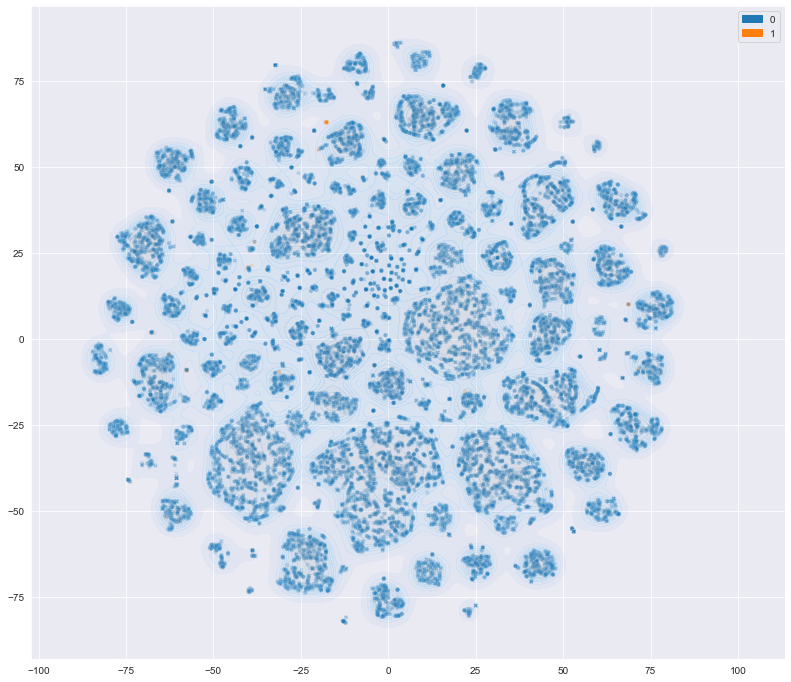

In [36]:
from sklearn.ensemble import VotingClassifier
model = VotingClassifier(estimators=[('KNN', KNeighborsClassifier(50)),
    ('KNN2', KNeighborsClassifier(20)), ('NB', ComplementNB()),], voting='soft')
model.fit(aug[1]+1.5, aug[0])
conf_matr(model, X_test[selected_feat]+1.5, y_test)
plt.gcf().set_size_inches(13.5, 12)
mesh_color = model.predict(X_train[selected_feat])
sns.scatterplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=y_train,alpha=0.2,size=2)
sns.kdeplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=y_train,alpha=0.1,size=2,cmap="Reds", shade=True, bw_adjust=.5)

In [ ]:
temp = []
for k in range(1, 41, 2):
    print(k)
    sX_train, sy_train=smaller_data(data_, frac=0.5)
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(sX_train[selected_feat], sy_train)
    temp2 = f1_score(y_train, model.predict(X_train[selected_feat]))
    temp3 = f1_score(y_test, model.predict(X_test[selected_feat]))

    temp.append([k, temp2/2, temp3/2])

1
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
3
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
5
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
7
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
9
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
11
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
13
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
15
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
17
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
19
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
21
0.49998464420625904
3.1530612244897958 0.7592137592137592 0.24078624078624078 16280
23
0.49998464420625904
3.1530612244897958 0.7592

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



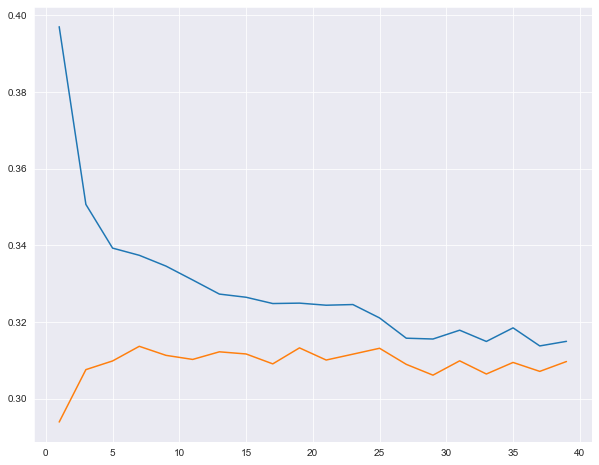

In [ ]:
lines = list(zip(*temp))
sns.lineplot(lines[0], lines[1])
sns.lineplot(lines[0], lines[2])
plt.gcf().set_size_inches(10, 8)

In [ ]:
from sklearn.model_selection import GridSearchCV
from deslib.des.des_p import DESP
param_grid = {
    'DFP': [True,False],
    'knne': [True, False],
    'k': [2,3,4,7],
    'knn_classifier': ['faiss', 'knn'],
        }
grid_search = GridSearchCV(estimator=DESP(), param_grid=param_grid)
grid_search.fit(aug[1], aug[0])
print(grid_search.best_params_)

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\deslib\util\knne.py:243: UserWarning:

"n_neighbors" is not a multiple of "n_classes". Got3 and 2.One or more classes will have one less instance.

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\deslib\util\knne.py:243: UserWarning:

"n_neighbors" is not a multiple of "n_classes". Got3 and 2.One or more classes will have one less instance.

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\deslib\util\knne.py:243: UserWarning:

"n_neighbors" is not a multiple of "n_classes". Got3 and 2.One or more classes will have one less instance.

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\deslib\util\knne.py:243: UserWarning:

"n_neighbors" is not a multiple of "n_classes". Got3 and 2.One or more classes will have one less instance.

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\deslib\util\knne.py:243

{'DFP': False, 'k': 2, 'knn_classifier': 'knn', 'knne': False}


{'0': {'precision': 0.9689718433437027, 'recall': 0.9769199839163651, 'f1-score': 0.9729296812429922, 'support': 12435}, '1': {'precision': 0.9233440170940171, 'recall': 0.8988559542381696, 'f1-score': 0.9109354413702241, 'support': 3846}, 'accuracy': 0.9584792088938026, 'macro avg': {'precision': 0.9461579302188599, 'recall': 0.9378879690772673, 'f1-score': 0.9419325613066081, 'support': 16281}, 'weighted avg': {'precision': 0.9581933518655201, 'recall': 0.9584792088938026, 'f1-score': 0.9582850128227068, 'support': 16281}}


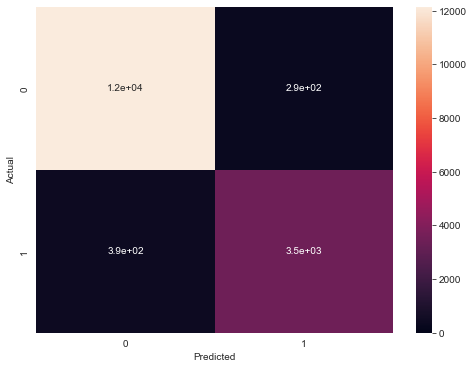

In [ ]:
model = DESP(**grid_search.best_params_)
model.fit(aug[1], aug[0])
conf_matr(model, X_test[selected_feat], y_test)

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1163: UserWarning:

cmap parameter ignored when using hue mapping.

E:\User Applications\Software\Miniconda3\envs\SpikingJelly\lib\site-packages\seaborn\distributions.py:1210: UserWarning:

The following kwargs were not used by contour: 'style', 'size'



<AxesSubplot:>

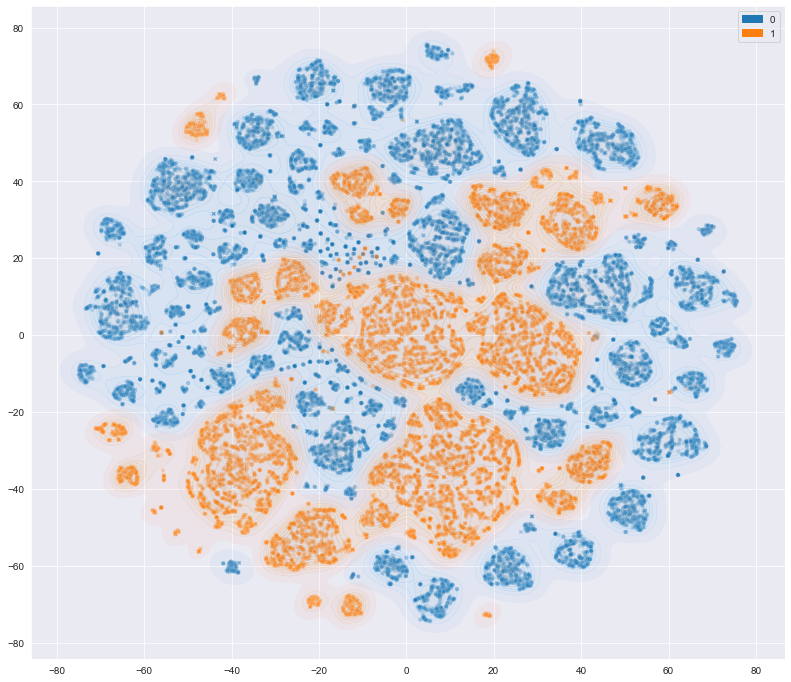

In [ ]:
plt.gcf().set_size_inches(13.5, 12)
sns.scatterplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=df[target_col],alpha=0.2,size=2)
sns.kdeplot(x=X_2d[:, 0],y=X_2d[:, 1],hue=mesh_color,style=df[target_col],alpha=0.1,size=2,cmap="Reds", shade=True, bw_adjust=.5)